# Prompt Generator for Stable Diffusion

```{note}
Install ekorpkit package first.

Set logging level to Warning, if you don't want to see verbose logging.

If you run this notebook in Colab, set Hardware accelerator to GPU.
```

```python
%pip install -U --pre ekorpkit[art]

exit()
```

## Preparing the environment


In [1]:
%config InlineBackend.figure_format='retina'
%load_ext autotime

from ekorpkit import eKonf

eKonf.setLogger("WARNING")
print("version:", eKonf.__version__)

is_colab = eKonf.is_colab()
print("is colab?", is_colab)
if is_colab:
    eKonf.mount_google_drive()
workspace_dir = "/content/drive/MyDrive/workspace"
project_name = "ekorpkit-book"
project_dir = eKonf.set_workspace(workspace=workspace_dir, project=project_name)
print("project_dir:", project_dir)

INFO:ekorpkit.base:Overwriting EKORPKIT_WORKSPACE_ROOT=/workspace with /content/drive/MyDrive/workspace
INFO:ekorpkit.base:Setting EKORPKIT_WORKSPACE_ROOT to /content/drive/MyDrive/workspace
INFO:ekorpkit.base:Overwriting EKORPKIT_PROJECT=ekorpkit-book with ekorpkit-book
INFO:ekorpkit.base:Setting EKORPKIT_PROJECT to ekorpkit-book
INFO:ekorpkit.base:Overwriting EKORPKIT_PROJECT_DIR=/workspace/projects/ekorpkit-book with /content/drive/MyDrive/workspace/projects/ekorpkit-book
INFO:ekorpkit.base:Loaded .env from /workspace/projects/ekorpkit-book/config/.env


version: 0.1.40.post0.dev41
is colab? False
project_dir: /content/drive/MyDrive/workspace/projects/ekorpkit-book
time: 945 ms (started: 2022-12-02 21:15:31 +00:00)


## Load a Generator and Generate Prompts

To download a certain dataset or model checkpoint, you may need to provide a HuggingFace API token. You can get one from [here](https://huggingface.co/settings/token).

```python

import os

# Set HuggingFace API token
os.environ["HF_USER_ACCESS_TOKEN"] = "YOUR_TOKEN"
```

In [3]:
from ekorpkit.models.art.prompt import PromptGenerator

pgen = PromptGenerator(verbose=False)

2022-12-02 21:15:55.202950: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
INFO:ekorpkit.base:Loaded .env from /workspace/projects/ekorpkit-book/config/.env
INFO:ekorpkit.base:Setting WANDB_PROJECT=ekorpkit-book
INFO:ekorpkit.base:No method defined to call


time: 10.3 s (started: 2022-12-02 21:15:54 +00:00)


### Loading a model

Before loading a model, you need to train a model first. To train a model, refer to the [Training a Generator](#training-a-generator) section.

In [3]:
# ekorpkit/stable-prompts
pgen.load_model(model_name="ekorpkit/stable-prompts")


[INFO|training_args.py:1324] 2022-12-02 21:08:56,468 >> PyTorch: setting up devices
[INFO|configuration_utils.py:652] 2022-12-02 21:08:56,510 >> loading configuration file /content/drive/MyDrive/workspace/projects/ekorpkit-book/aiart/models/ekorpkit/stable-prompts/config.json
[INFO|configuration_utils.py:706] 2022-12-02 21:08:56,511 >> Model config GPT2Config {
  "_name_or_path": "/content/drive/MyDrive/workspace/projects/ekorpkit-book/aiart/models/ekorpkit/stable-prompts",
  "_num_labels": 1,
  "activation_function": "gelu_new",
  "architectures": [
    "GPT2LMHeadModel"
  ],
  "attn_pdrop": 0.1,
  "bos_token_id": 50256,
  "embd_pdrop": 0.1,
  "eos_token_id": 50256,
  "id2label": {
    "0": "LABEL_0"
  },
  "initializer_range": 0.02,
  "label2id": {
    "LABEL_0": 0
  },
  "layer_norm_epsilon": 1e-05,
  "model_type": "gpt2",
  "n_ctx": 1024,
  "n_embd": 768,
  "n_head": 12,
  "n_inner": null,
  "n_layer": 6,
  "n_positions": 1024,
  "reorder_and_upcast_attn": false,
  "resid_pdrop": 0

time: 1.28 s (started: 2022-12-02 21:08:56 +00:00)


### Generating prompts

You can generate prompts using the `generate_prompts` function. The function takes the following arguments:

- `prompt`: The prompt to be used for generating prompts. If `None`, the prompt will be generated automatically.
- `num_prompts_to_generate`: The number of prompts to be generated.
- `generate_images`: Whether to generate images for the prompts.
- `num_samples`: The number of images to be generated for each prompt.
- For other arguments, refer to the following code.


In [4]:
eKonf.print(pgen._generate_)

{'check_start_token': True,
 'max_prompt_length': 50,
 'min_prompt_length': 30,
 'num_prompts_to_generate': 10,
 'prompt': None,
 'temperature': 1.2,
 'top_k': 70,
 'top_p': 0.9}
time: 1.36 ms (started: 2022-12-02 21:08:57 +00:00)


Prompt[0]: people looking out a window at night in ancient ruins, in a highly detailed epic CG render, dramatic light, epic shadows, dramatic lightinga 3D portrait of a dragon from a fantasy fantasy medium portrait in a beautiful fantasy, elegant, high detail,


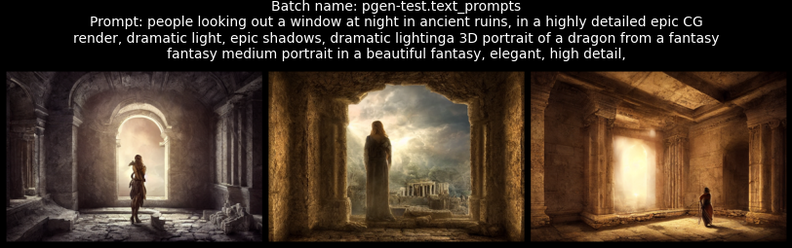

Prompt[1]: people looking out a window, d & d, fantasy, intricate, elegant, highly detailed, digital painting, artstation, concept art, smooth, sharp focus, illustration, art by artgerm and greg rutkowski and alphonse


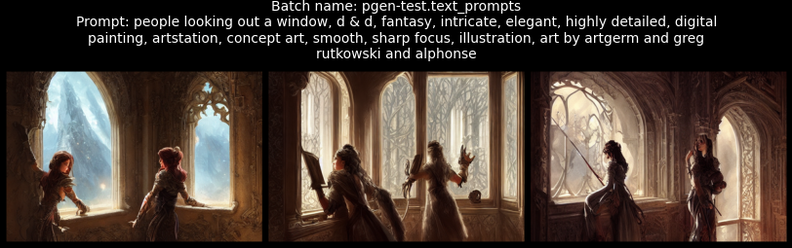

Prompt[2]: people looking out a window at night, in the style of Daniel Craig and Steve Austin. trending on artstationin a desert, d & d, fantasy, intricate, elegant, highly detailed, digital painting, artstation, concept art, smooth,


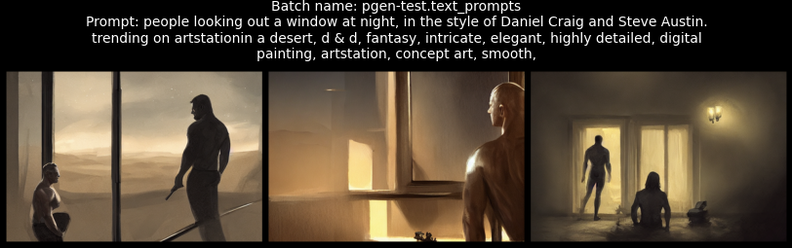

Prompt[3]: people looking out a window at a beautiful view over the bridge on theland, the riverbeds of mountains, beautiful dramatic lighting, beautiful landscape, perfect face, intricate details, artstationhd, cgsocietya photo of an orange


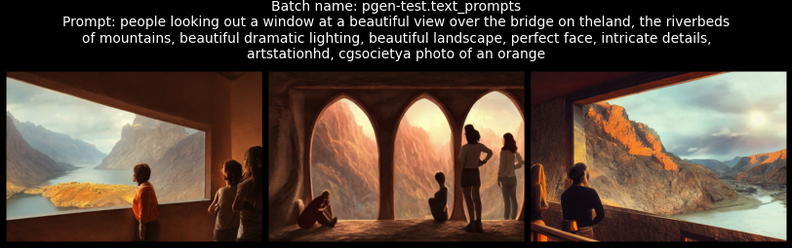

Prompt[4]: people looking out a window. The eyes, fine details, elegant, by greg rutkowski and alphonse muchacloseup shot of a cyberpunk robot in front of a dark dark cave, full of colors, vibrant, intricate,


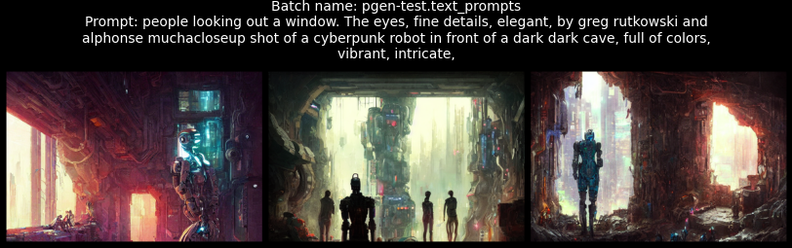

time: 3min 5s (started: 2022-12-02 21:08:57 +00:00)


In [5]:
batch_name = "pgen-test"
prompts = pgen.generate_prompts(
    batch_name = batch_name,
    prompt="people looking out a",
    num_prompts_to_generate=5,
    generate_images=True,
    num_samples=3,
)

### Generating images for prompts

Prompt[0]: people looking out a window at night in ancient ruins, in a highly detailed epic CG render, dramatic light, epic shadows, dramatic lightinga 3D portrait of a dragon from a fantasy fantasy medium portrait in a beautiful fantasy, elegant, high detail,


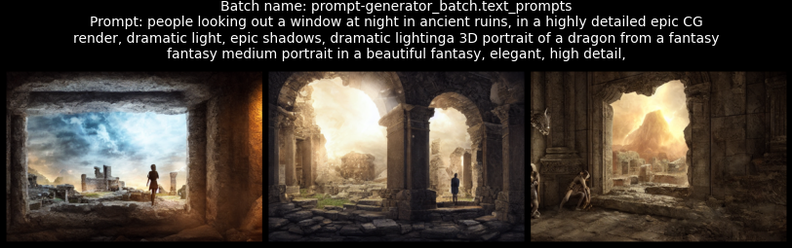

Prompt[1]: people looking out a window, d & d, fantasy, intricate, elegant, highly detailed, digital painting, artstation, concept art, smooth, sharp focus, illustration, art by artgerm and greg rutkowski and alphonse


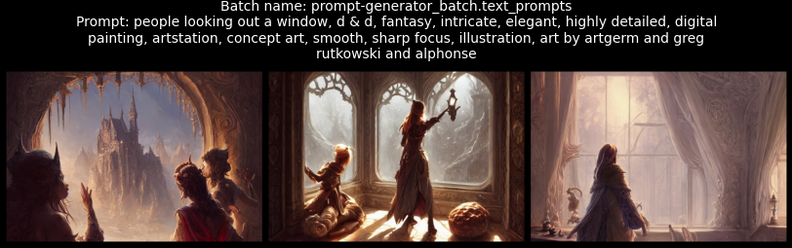

Prompt[2]: people looking out a window at night, in the style of Daniel Craig and Steve Austin. trending on artstationin a desert, d & d, fantasy, intricate, elegant, highly detailed, digital painting, artstation, concept art, smooth,


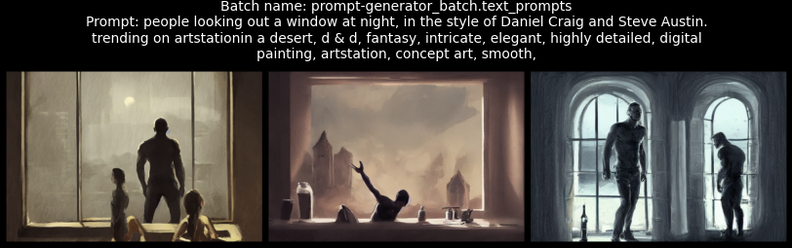

Prompt[3]: people looking out a window at a beautiful view over the bridge on theland, the riverbeds of mountains, beautiful dramatic lighting, beautiful landscape, perfect face, intricate details, artstationhd, cgsocietya photo of an orange


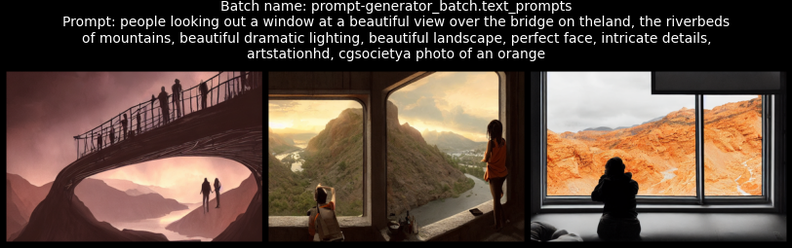

Prompt[4]: people looking out a window. The eyes, fine details, elegant, by greg rutkowski and alphonse muchacloseup shot of a cyberpunk robot in front of a dark dark cave, full of colors, vibrant, intricate,


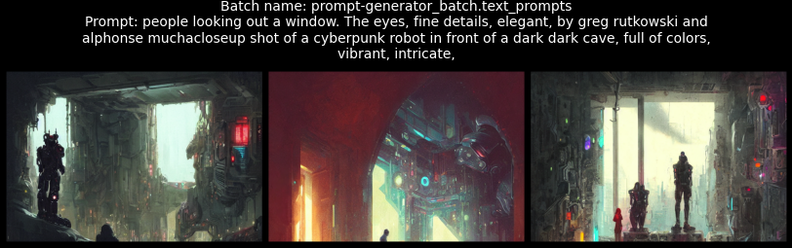

time: 1min 28s (started: 2022-12-02 21:12:49 +00:00)


In [6]:
results = pgen.generate_images(
    prompts=prompts,
    num_samples=3,
    num_inference_steps=50,
)

### Generating images for one prompt

Prompt: people looking out a window at night in ancient ruins, in a highly detailed epic CG render, dramatic light, epic shadows, dramatic lightinga 3D portrait of a dragon from a fantasy fantasy medium portrait in a beautiful fantasy, elegant, high detail,


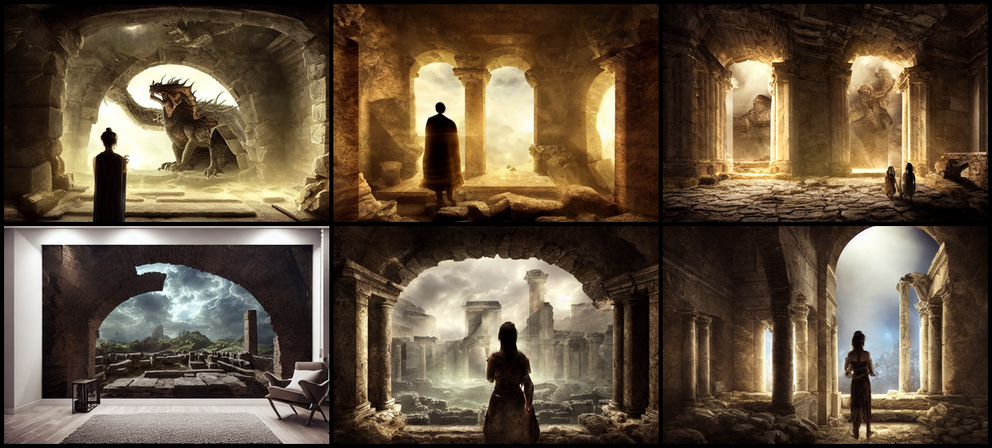

time: 33.5 s (started: 2022-12-02 21:14:27 +00:00)


In [7]:
results = pgen.imagine(
    text_prompts=prompts[0],
    num_samples=6,
    num_inference_steps=50,
    guidance_scale=10,
)

## Training a Generator

### Preparing a dataset

You can use any dataset you want. However, the dataset should be in the format of [HuggingFace Datasets](https://huggingface.co/docs/datasets/).

1. Using a dataset from HuggingFace Hub

To track runs with wandb, you may need to provide a Weights & Biases API Key. You can get one from [here](https://wandb.ai/settings).

```python

import os

# Set HuggingFace API token
os.environ["WANDB_API_KEY"] = "YOUR_KEY"
```

In [4]:
pgen.dataset.validation_split_percentage = 5
pgen.load_datasets("Gustavosta/Stable-Diffusion-Prompts")
pgen.raw_datasets

INFO:datasets.builder:Overwrite dataset info from restored data version.
INFO:datasets.info:Loading Dataset info from /content/drive/MyDrive/workspace/.cache/Gustavosta___parquet/Gustavosta--Stable-Diffusion-Prompts-d22aeec0ba2a9fdb/0.0.0/2a3b91fbd88a2c90d1dbbb32b460cf621d31bd5b05b934492fdef7d8d6f236ec
INFO:datasets.info:Loading Dataset info from /content/drive/MyDrive/workspace/.cache/Gustavosta___parquet/Gustavosta--Stable-Diffusion-Prompts-d22aeec0ba2a9fdb/0.0.0/2a3b91fbd88a2c90d1dbbb32b460cf621d31bd5b05b934492fdef7d8d6f236ec


  0%|          | 0/2 [00:00<?, ?it/s]

INFO:datasets.builder:Overwrite dataset info from restored data version.
INFO:datasets.info:Loading Dataset info from /content/drive/MyDrive/workspace/.cache/Gustavosta___parquet/Gustavosta--Stable-Diffusion-Prompts-d22aeec0ba2a9fdb/0.0.0/2a3b91fbd88a2c90d1dbbb32b460cf621d31bd5b05b934492fdef7d8d6f236ec
INFO:datasets.info:Loading Dataset info from /content/drive/MyDrive/workspace/.cache/Gustavosta___parquet/Gustavosta--Stable-Diffusion-Prompts-d22aeec0ba2a9fdb/0.0.0/2a3b91fbd88a2c90d1dbbb32b460cf621d31bd5b05b934492fdef7d8d6f236ec
INFO:datasets.builder:Overwrite dataset info from restored data version.
INFO:datasets.info:Loading Dataset info from /content/drive/MyDrive/workspace/.cache/Gustavosta___parquet/Gustavosta--Stable-Diffusion-Prompts-d22aeec0ba2a9fdb/0.0.0/2a3b91fbd88a2c90d1dbbb32b460cf621d31bd5b05b934492fdef7d8d6f236ec
INFO:datasets.info:Loading Dataset info from /content/drive/MyDrive/workspace/.cache/Gustavosta___parquet/Gustavosta--Stable-Diffusion-Prompts-d22aeec0ba2a9fdb/0

DatasetDict({
    train: Dataset({
        features: ['Prompt'],
        num_rows: 70032
    })
    test: Dataset({
        features: ['Prompt'],
        num_rows: 8192
    })
    validation: Dataset({
        features: ['Prompt'],
        num_rows: 3686
    })
})

time: 15.9 s (started: 2022-12-02 21:16:05 +00:00)


In [5]:
model_name = "ekorpkit/stable-prompts"

pgen.dataset.line_by_line = False
# pgen.dataset.group_by_shuffling = True
pgen.training.num_train_epochs = 1
pgen.training.logging_steps = 100
pgen.model.model_name = model_name
# pgen.model.ignore_model_path = True

pgen.train()

[INFO|training_args.py:1324] 2022-12-02 21:16:25,192 >> PyTorch: setting up devices
[INFO|tokenization_utils_base.py:1773] 2022-12-02 21:16:25,208 >> loading file vocab.json
[INFO|tokenization_utils_base.py:1773] 2022-12-02 21:16:25,208 >> loading file merges.txt
[INFO|tokenization_utils_base.py:1773] 2022-12-02 21:16:25,209 >> loading file tokenizer.json
[INFO|tokenization_utils_base.py:1773] 2022-12-02 21:16:25,209 >> loading file added_tokens.json
[INFO|tokenization_utils_base.py:1773] 2022-12-02 21:16:25,209 >> loading file special_tokens_map.json
[INFO|tokenization_utils_base.py:1773] 2022-12-02 21:16:25,209 >> loading file tokenizer_config.json
[INFO|tokenization_utils_base.py:898] 2022-12-02 21:16:25,263 >> Assigning <pad> to the pad_token key of the tokenizer
[INFO|tokenization_utils_base.py:898] 2022-12-02 21:16:25,263 >> Assigning <bop> to the bos_token key of the tokenizer
[INFO|tokenization_utils_base.py:898] 2022-12-02 21:16:25,263 >> Assigning <eop> to the eos_token key o

Running tokenizer on every text in dataset:   0%|          | 0/71 [00:00<?, ?ba/s]

INFO:datasets.arrow_dataset:Caching processed dataset at /content/drive/MyDrive/workspace/.cache/Gustavosta___parquet/Gustavosta--Stable-Diffusion-Prompts-d22aeec0ba2a9fdb/0.0.0/2a3b91fbd88a2c90d1dbbb32b460cf621d31bd5b05b934492fdef7d8d6f236ec/cache-c18d25663c203982.arrow


Running tokenizer on every text in dataset:   0%|          | 0/9 [00:00<?, ?ba/s]

INFO:datasets.arrow_dataset:Caching processed dataset at /content/drive/MyDrive/workspace/.cache/Gustavosta___parquet/Gustavosta--Stable-Diffusion-Prompts-d22aeec0ba2a9fdb/0.0.0/2a3b91fbd88a2c90d1dbbb32b460cf621d31bd5b05b934492fdef7d8d6f236ec/cache-3aa9bea172d94ae9.arrow


Running tokenizer on every text in dataset:   0%|          | 0/4 [00:00<?, ?ba/s]

INFO:datasets.arrow_dataset:Caching processed dataset at /content/drive/MyDrive/workspace/.cache/Gustavosta___parquet/Gustavosta--Stable-Diffusion-Prompts-d22aeec0ba2a9fdb/0.0.0/2a3b91fbd88a2c90d1dbbb32b460cf621d31bd5b05b934492fdef7d8d6f236ec/cache-a46354bdc81f9d52.arrow


Grouping texts in chunks of 1024:   0%|          | 0/71 [00:00<?, ?ba/s]

INFO:datasets.arrow_dataset:Caching processed dataset at /content/drive/MyDrive/workspace/.cache/Gustavosta___parquet/Gustavosta--Stable-Diffusion-Prompts-d22aeec0ba2a9fdb/0.0.0/2a3b91fbd88a2c90d1dbbb32b460cf621d31bd5b05b934492fdef7d8d6f236ec/cache-ebf8ffb29aed8f41.arrow


Grouping texts in chunks of 1024:   0%|          | 0/9 [00:00<?, ?ba/s]

INFO:datasets.arrow_dataset:Caching processed dataset at /content/drive/MyDrive/workspace/.cache/Gustavosta___parquet/Gustavosta--Stable-Diffusion-Prompts-d22aeec0ba2a9fdb/0.0.0/2a3b91fbd88a2c90d1dbbb32b460cf621d31bd5b05b934492fdef7d8d6f236ec/cache-4de75a05d485e843.arrow


Grouping texts in chunks of 1024:   0%|          | 0/4 [00:00<?, ?ba/s]

INFO:datasets.arrow_dataset:Caching processed dataset at /content/drive/MyDrive/workspace/.cache/Gustavosta___parquet/Gustavosta--Stable-Diffusion-Prompts-d22aeec0ba2a9fdb/0.0.0/2a3b91fbd88a2c90d1dbbb32b460cf621d31bd5b05b934492fdef7d8d6f236ec/cache-5e2f3e4a06270ced.arrow
[INFO|trainer.py:557] 2022-12-02 21:16:49,545 >> Using cuda_amp half precision backend
[INFO|trainer.py:725] 2022-12-02 21:16:49,807 >> The following columns in the training set don't have a corresponding argument in `GPT2LMHeadModel.forward` and have been ignored: special_tokens_mask. If special_tokens_mask are not expected by `GPT2LMHeadModel.forward`,  you can safely ignore this message.
[INFO|trainer.py:1608] 2022-12-02 21:16:49,813 >> ***** Running training *****
[INFO|trainer.py:1609] 2022-12-02 21:16:49,814 >>   Num examples = 4242
[INFO|trainer.py:1610] 2022-12-02 21:16:49,814 >>   Num Epochs = 1
[INFO|trainer.py:1611] 2022-12-02 21:16:49,814 >>   Instantaneous batch size per device = 1
[INFO|trainer.py:1612] 2

[WARNING|logging.py:275] 2022-12-02 21:16:57,551 >> You're using a GPT2TokenizerFast tokenizer. Please note that with a fast tokenizer, using the `__call__` method is faster than using a method to encode the text followed by a call to the `pad` method to get a padded encoding.


Step,Training Loss,Validation Loss


[INFO|trainer.py:1859] 2022-12-02 21:18:26,307 >> 

Training completed. Do not forget to share your model on huggingface.co/models =)


[INFO|trainer.py:2678] 2022-12-02 21:18:26,310 >> Saving model checkpoint to /content/drive/MyDrive/workspace/projects/ekorpkit-book/aiart/models/ekorpkit/stable-prompts
[INFO|configuration_utils.py:447] 2022-12-02 21:18:26,311 >> Configuration saved in /content/drive/MyDrive/workspace/projects/ekorpkit-book/aiart/models/ekorpkit/stable-prompts/config.json
[INFO|modeling_utils.py:1624] 2022-12-02 21:18:26,765 >> Model weights saved in /content/drive/MyDrive/workspace/projects/ekorpkit-book/aiart/models/ekorpkit/stable-prompts/pytorch_model.bin
[INFO|tokenization_utils_base.py:2125] 2022-12-02 21:18:26,767 >> tokenizer config file saved in /content/drive/MyDrive/workspace/projects/ekorpkit-book/aiart/models/ekorpkit/stable-prompts/tokenizer_config.json
[INFO|tokenization_utils_base.py:2132] 2022-12-02 21:18:26,767 >> Special tokens file saved in /conten

***** train metrics *****
  epoch                    =       0.99
  total_flos               =  1027917GF
  train_loss               =       2.68
  train_runtime            = 0:01:36.49
  train_samples            =       4242
  train_samples_per_second =     43.962
  train_steps_per_second   =      0.684


***** eval metrics *****
  epoch                   =       0.99
  eval_loss               =     2.5596
  eval_runtime            = 0:00:01.80
  eval_samples            =        222
  eval_samples_per_second =    123.091
  eval_steps_per_second   =     15.525
  perplexity              =    12.9301


[INFO|modelcard.py:449] 2022-12-02 21:18:29,835 >> Dropping the following result as it does not have all the necessary fields:
{'task': {'name': 'Causal Language Modeling', 'type': 'text-generation'}, 'dataset': {'name': 'Gustavosta/Stable-Diffusion-Prompts', 'type': 'Gustavosta/Stable-Diffusion-Prompts'}}


time: 2min 4s (started: 2022-12-02 21:16:25 +00:00)


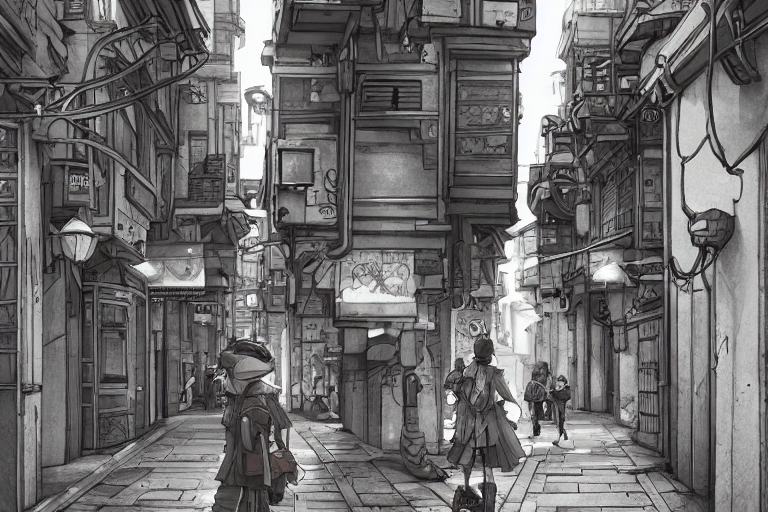

  0%|          | 0/51 [00:00<?, ?it/s]

In [ ]:
pgen.load_model(model_name=model_name)
prompts = pgen.generate_prompts(
    prompt="people looking out a lonely city street",
    num_prompts_to_generate=2,
    generate_images=True,
    num_samples=2,
)

2. Using a dataset from a text file

In [3]:
prompt_uri = "https://raw.githubusercontent.com/entelecheia/ekorpkit-book/main/assets/data/prompt_parrot.txt"
dataset = pgen.load_dataset("text", data_files=prompt_uri)
dataset

  0%|          | 0/1 [00:00<?, ?it/s]

DatasetDict({
    train: Dataset({
        features: ['text'],
        num_rows: 185
    })
})

time: 1.29 s (started: 2022-11-10 09:41:31 +00:00)


In [5]:
model_name="ekorpkit/prompt_parrot"

pgen.train()

  0%|          | 0/1 [00:00<?, ?ba/s]

***** Running training *****
  Num examples = 185
  Num Epochs = 3
  Instantaneous batch size per device = 1
  Total train batch size (w. parallel, distributed & accumulation) = 8
  Gradient Accumulation steps = 1
  Total optimization steps = 72
Automatic Weights & Biases logging enabled, to disable set os.environ["WANDB_DISABLED"] = "true"
wandb: Currently logged in as: entelecheia. Use `wandb login --relogin` to force relogin


Step,Training Loss




Training completed. Do not forget to share your model on huggingface.co/models =)




train/epoch,▁
train/global_step,▁
train/total_flos,▁
train/train_loss,▁
train/train_runtime,▁
train/train_samples_per_second,▁
train/train_steps_per_second,▁
train/epoch,3.0
train/global_step,72
train/total_flos,145019696578560.0
train/train_loss,8.11367


Configuration saved in /content/drive/MyDrive/workspace/projects/ekorpkit-book/disco-imagen/models/ekorpkit/prompt_parrot/config.json
Model weights saved in /content/drive/MyDrive/workspace/projects/ekorpkit-book/disco-imagen/models/ekorpkit/prompt_parrot/pytorch_model.bin


time: 1min 32s (started: 2022-11-10 09:42:17 +00:00)


Prompt: people looking out a lonely city street. vibrant nightscape landscape by Jean Eichler & Tom Riezzler, paintingstation paintingine de Jean du Fontaine


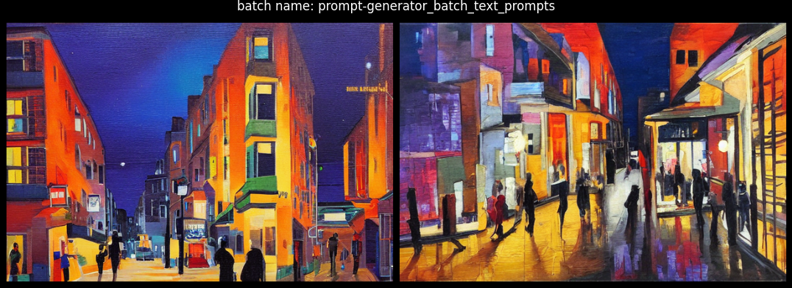

Prompt: people looking out a lonely city street street in a beautiful landscape by Steven Adams, lushly, and landscapes by Robert F. Bennett, The Lost and Skyward, a matte art by Alex Turner, matte painterabby, pixelism


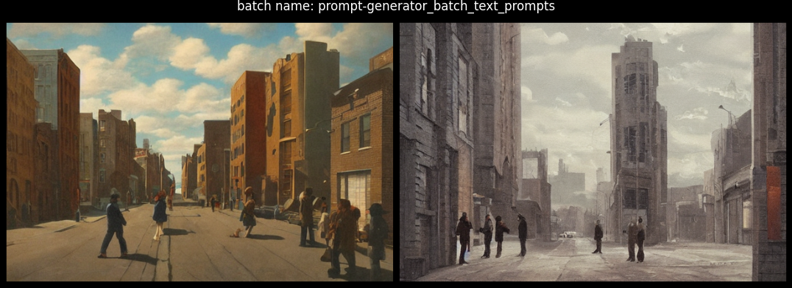

time: 1min 14s (started: 2022-11-10 09:43:50 +00:00)


In [6]:
pgen.load_model(model_name=model_name)
prompts = pgen.generate_prompts(
    prompt="people looking out a lonely city street",
    num_prompts_to_generate=2,
    generate_images=True,
    num_samples=2,
)

## References

- [Gustavosta/Stable-Diffusion-Prompts](https://huggingface.co/datasets/Gustavosta/Stable-Diffusion-Prompts)